# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [1]:
# !python -m pip install pyyaml==5.1
# import sys, os, distutils.core
# # Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# # See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
# !git clone 'https://github.com/facebookresearch/detectron2'
# dist = distutils.core.run_setup("./detectron2/setup.py")
# !python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# sys.path.insert(0, os.path.abspath('./detectron2'))

# # Properly install detectron2. (Please do not install twice in both ways)
# # !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [2]:
import sys
print(sys.executable)

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"


/trunk2/yufei/anaconda3/envs/detectron/bin/python


In [3]:
import numpy as np
m = np.zeros(3)
m

array([0., 0., 0.])

In [10]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2017 NVIDIA Corporation
Built on Fri_Nov__3_21:07:56_CDT_2017
Cuda compilation tools, release 9.1, V9.1.85
torch:  1.10 ; cuda:  1.10.0
detectron2: 0.6


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
from tqdm import tqdm
import os
import json
import cv2
import random
# from google.colab.patches import cv2_imshow
from IPython.display import display, Image
import io

def cv2_imshow(a):
    """A replacement for cv2.imshow() for use in Jupyter notebooks."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    _, buffer = cv2.imencode(".jpg", a, [int(cv2.IMWRITE_JPEG_QUALITY), 95])
    display(Image(data=buffer))

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

/trunk2/yufei/anaconda3/envs/detectron/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [5]:
height, width = cv2.imread("/trunk/shared/pair_data/A36588/00013.000.001.tif").shape[:2]
print(height, width)

3874 4594


In [6]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")
from pathlib import Path
import os
import cv2
import json
import glob
from detectron2.structures import BoxMode

def find_image_file(base_path, file_name_without_extension):
    # Define the possible image extensions
    image_extensions = ['.jpg', '.png', '.JPG', '.tif']
    
    # Search for image files with the specified base name and extensions
    for extension in image_extensions:
        # Build the path for the image file
        image_path = os.path.join(base_path, file_name_without_extension + extension)
        if os.path.exists(image_path):
            return image_path  # Return the image path if file exists

    return None  # If no image file is found

def process_annotations(annotations):
    objs = []
    for anno in annotations:
        px = [point[0] for point in anno['polygon']]
        py = [point[1] for point in anno['polygon']]
        poly = [(x, y) for x, y in zip(px, py)]
        poly_flatten = [p for x in poly for p in x]

        obj = {
            "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
            "bbox_mode": BoxMode.XYXY_ABS,
            "segmentation": [poly_flatten],
            "category_id": 0,  # Assuming you have only one category
            "confidence": anno['confidence']
        }
        objs.append(obj)
    return objs

def get_custom_dicts(json_dir, image_dir):
    print("json_dir: ", json_dir)
    print("image_dir: ", image_dir)
    dataset_dicts = []
    json_files = list(Path(json_dir).rglob('*.json'))  # Get the list of JSON files

    # Use tqdm to show a progress bar
    for json_file_path in tqdm(json_files, desc='Processing JSON files'):
        with open(str(json_file_path), 'r') as f:
            annotations_data = json.load(f)
        
        record = {}
        file_name_without_extension = json_file_path.stem

        # Build the path to the image by using the base image directory and the image filename
        image_file = find_image_file(image_dir, file_name_without_extension)
        if image_file is None:
            print(f"No image found for {json_file_path.name}, skipping.")
            continue
        
        # Read image to get its width and height
        image = cv2.imread(image_file)
        height, width = image.shape[:2]

        # Create the record dict
        record["file_name"] = image_file
        record["image_id"] = file_name_without_extension
        record["height"] = height
        record["width"] = width

        # Process the annotations
        record["annotations"] = process_annotations(annotations_data)
        dataset_dicts.append(record)
    
    return dataset_dicts

# Usage
# img_dir = "/trunk2/yufei/datasets/jsons"
# base_path = '/trunk2/yufei/datasets/pictures/'
# dataset_dicts = get_custom_dicts(img_dir, base_path)

# Assuming your directories are named "train", "val", and "test" under "/trunk2/yufei/datasets/pictures/"
# for d in ["train", "val", "test"]:
for d in ["train", "validation"]:
    DatasetCatalog.register("my_dataset_" + d, lambda d=d: get_custom_dicts(f"/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/{d}", f"/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/{d}"))
    MetadataCatalog.get("my_dataset_" + d).set(thing_classes=["my_class"])

# Now you have metadata for each of the splits
train_metadata = MetadataCatalog.get("my_dataset_train")
val_metadata = MetadataCatalog.get("my_dataset_validation")
# test_metadata = MetadataCatalog.get("my_dataset_test")



To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



json_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/train
image_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/train


Processing JSON files:  64%|██████▍   | 173/271 [00:10<00:05, 16.52it/s]

No image found for A44230_00473.000.001.json, skipping.


Processing JSON files: 100%|██████████| 271/271 [00:16<00:00, 16.78it/s]


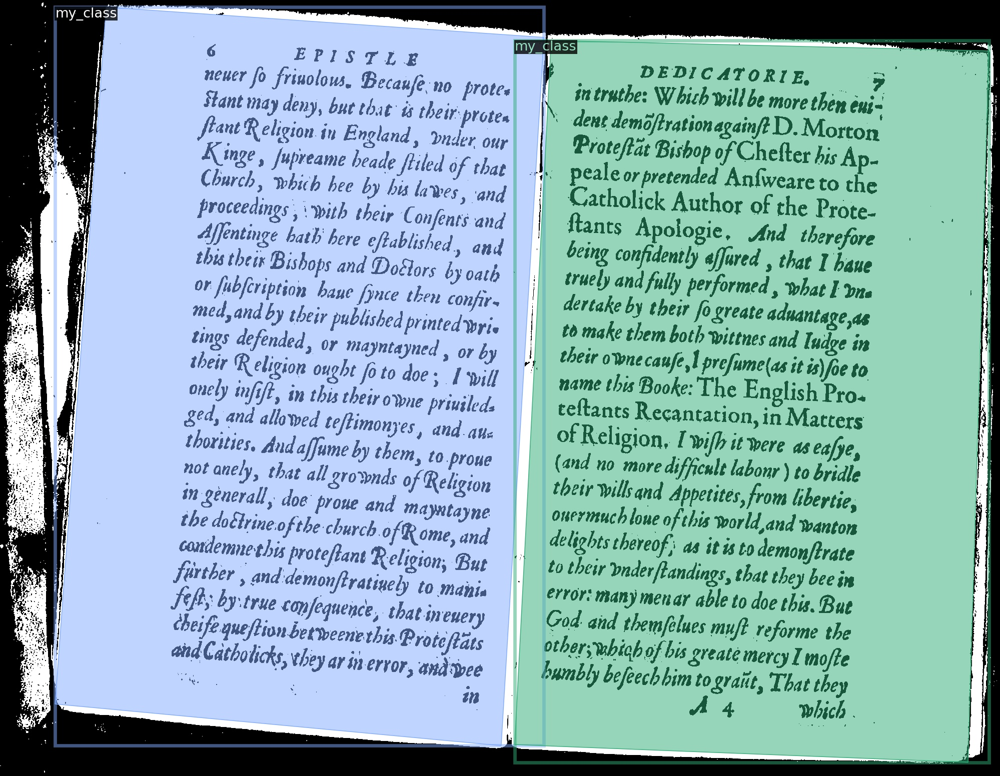

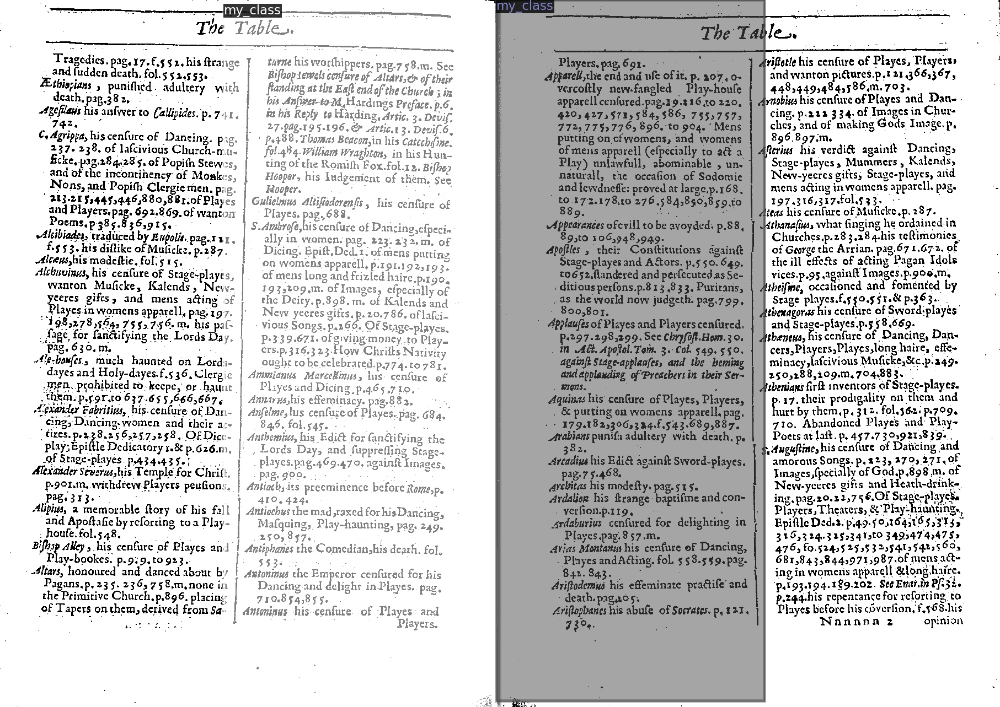

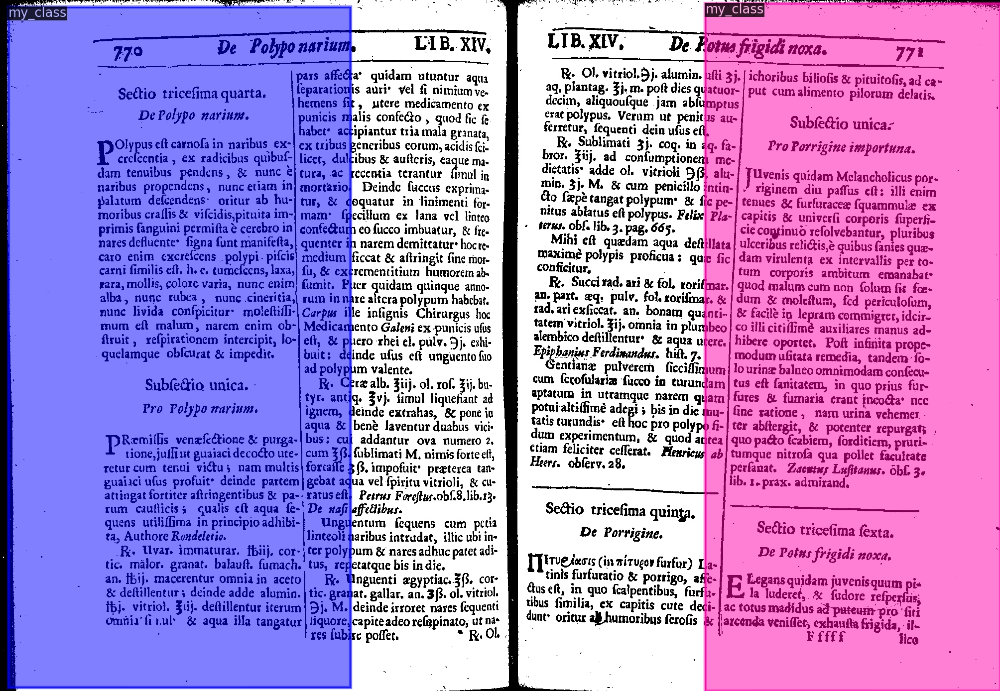

In [7]:
# Usage
img_dir = "/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/train"
base_path = '/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/train'
dataset_dicts = get_custom_dicts(img_dir, base_path)

# dataset_dicts = get_custom_dicts(f"/trunk2/yufei/datasets/jsons/train", f"/trunk2/yufei/datasets/pictures/train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [12]:
from detectron2.engine import DefaultTrainer
print(torch.cuda.device_count(), "GPUs")
trainFlag = False
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4 # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1200    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

if trainFlag:
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()

1 GPUs
[08/05 07:42:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
   

Processing JSON files:   6%|▋         | 17/271 [00:00<00:16, 15.55it/s]

Processing JSON files:  64%|██████▍   | 173/271 [00:12<00:08, 12.24it/s]

No image found for A44230_00473.000.001.json, skipping.


Processing JSON files: 100%|██████████| 271/271 [00:18<00:00, 14.93it/s]

[08/05 07:42:25 d2.data.build]: Removed 0 images with no usable annotations. 270 images left.
[08/05 07:42:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[08/05 07:42:25 d2.data.build]: Using training sampler TrainingSampler
[08/05 07:42:25 d2.data.common]: Serializing 270 elements to byte tensors and concatenating them all ...


[08/05 07:42:25 d2.data.common]: Serialized dataset takes 0.19 MiB


Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[08/05 07:42:25 d2.engine.train_loop]: Starting training from iteration 0
[08/05 07:42:44 d2.utils.events]:  eta: 0:16:40  iter: 19  total_loss: 2.002  loss_cls: 0.5803  loss_box_reg: 0.6823  loss_mask: 0.6824  loss_rpn_cls: 0.02133  loss_rpn_loc: 0.01762  time: 0.9300  data_time: 0.5577  lr: 4.9953e-06  max_mem: 6735M
[08/05 07:42:58 d2.utils.events]:  eta: 0:15:17  iter: 39  total_loss: 1.934  loss_cls: 0.5263  loss_box_reg: 0.7177  loss_mask: 0.6388  loss_rpn_cls: 0.01922  loss_rpn_loc: 0.01824  time: 0.8265  data_time: 0.3339  lr: 9.9902e-06  max_mem: 6735M
[08/05 07:43:14 d2.utils.events]:  eta: 0:14:42  iter: 59  total_loss: 1.766  loss_cls: 0.4456  loss_box_reg: 0.724  loss_mask: 0.555  loss_rpn_cls: 0.01144  loss_rpn_loc: 0.02053  time: 0.8033  data_time: 0.3594  lr: 1.4985e-05  max_mem: 6735M
[08/05 07:43:28 d2.utils.events]:  eta: 0:13:27  iter: 79  total_loss: 1.615  loss_cls: 0.3879  loss_box_reg: 0.7462  loss_mask: 0.4594  loss_rpn_cls: 0.006491  loss_rpn_loc: 0.01882  tim

In [ ]:
# # Look at training curves in tensorboard:
# %load_ext tensorboard
# %tensorboard --logdir output

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [13]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.70   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

In [14]:
import json
import numpy as np
import cv2
import torch
from pathlib import Path

# Function to save the prediction outputs to JSON files
def save_text_line_to_json(outputs, image_path, output_dir):
    """Converts prediction output to a JSON format and saves it to a file."""
    os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists

    # Initialize the record dictionary to store image text_line
    record = {
        "img_size": outputs['instances'].image_size,
        "text_line": []
    }

    # Extract relevant data from the outputs
    boxes = outputs['instances'].pred_boxes.tensor.cpu().numpy()
    scores = outputs['instances'].scores.cpu().numpy()
    classes = outputs['instances'].pred_classes.cpu().numpy()

    if outputs['instances'].has('pred_masks'):
        # Convert binary masks to boolean arrays
        masks = outputs['instances'].pred_masks.cpu().numpy()

    # Iterate over each instance prediction
    for idx in range(len(scores)):
        # Create a list to store all points from all contours of the current mask
        all_points = []

        if outputs['instances'].has('pred_masks'):
            mask = masks[idx].astype('uint8')
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            
            # Iterate over all contours and extend the all_points list with points from each contour
            for contour in contours:
                # Flatten the contour array and extend all_points
                all_points.extend(contour.squeeze(axis=1).tolist())

        record['text_line'].append({
            "confidence": float(scores[idx]),
            "polygon": all_points  # Use the flattened list of points
        })

    # Construct file path to save the JSON data
    base_name = Path(image_path).stem
    json_file_name = f"{base_name}.json"
    json_path = os.path.join(output_dir, json_file_name)

    # Write data to JSON file
    with open(json_path, 'w') as f:
        json.dump(record, f, indent=4)
    
    print(f"text_line saved to {json_path}")
    return json_path

json_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/validation
image_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/validation


Processing JSON files: 100%|██████████| 3/3 [00:00<00:00, 53.55it/s]
/trunk2/yufei/anaconda3/envs/detectron/lib/python3.8/site-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


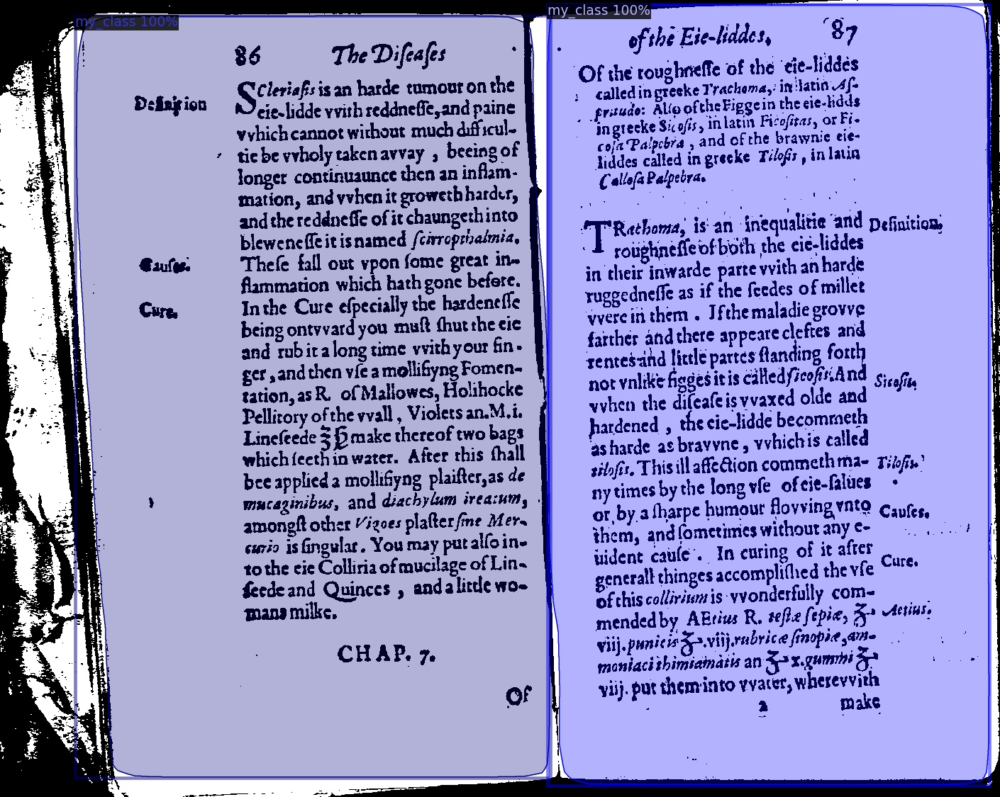

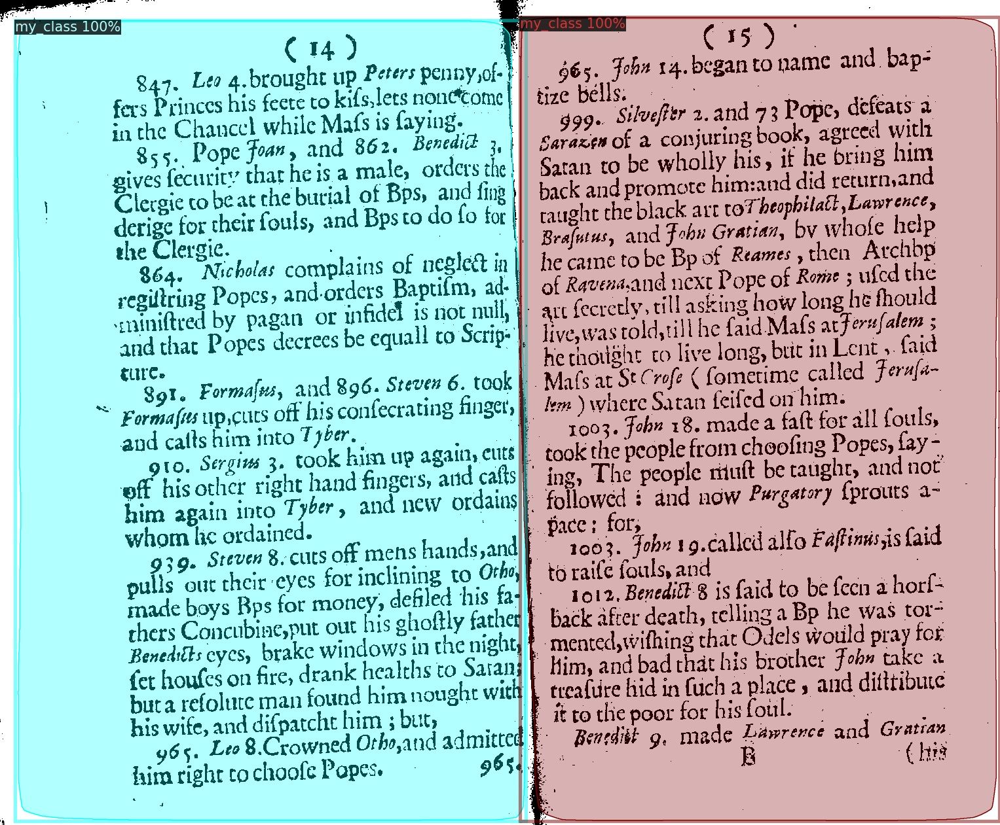

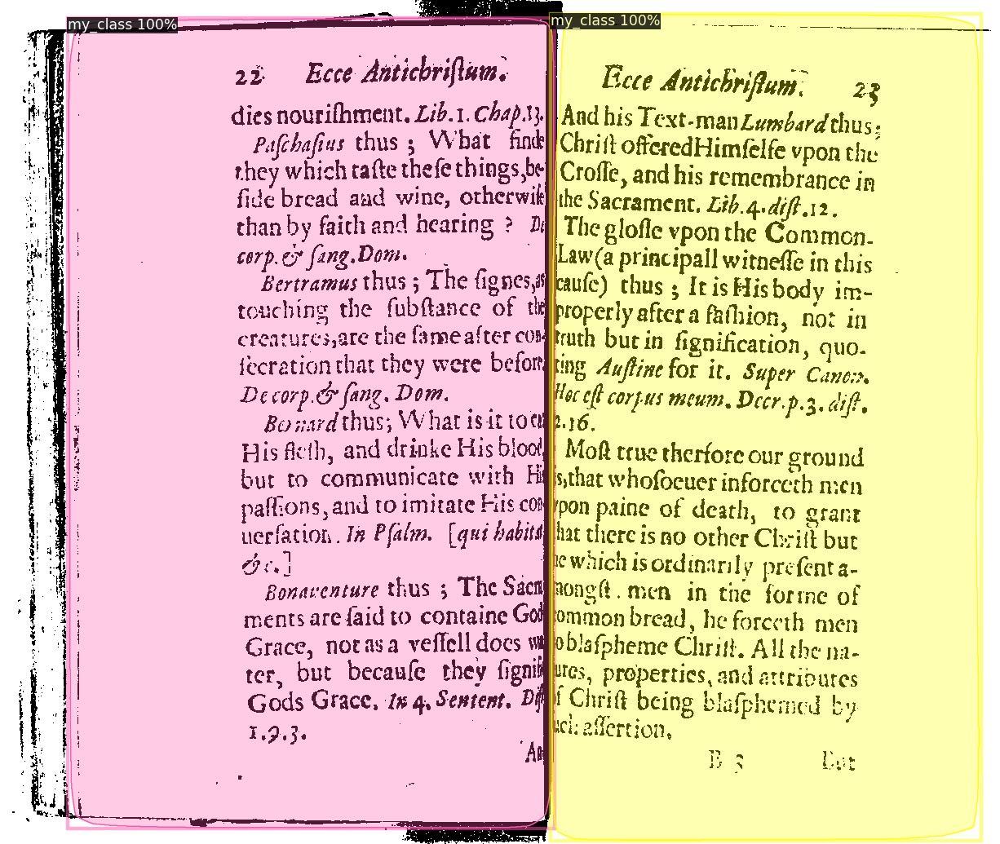

done


In [15]:
# validation set
from detectron2.utils.visualizer import ColorMode
img_dir = '/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/validation'
base_path = "/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/validation"
dataset_dicts = get_custom_dicts(img_dir, base_path)
# dataset_dicts = get_custom_dicts("balloon/val")
for d in dataset_dicts:
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
print("done")

In [16]:
# Get a list of all tif files in the directory
source_directory = "/trunk3/shared/datasets/EEBO"
tif_files = [os.path.join(source_directory, f) for f in os.listdir(source_directory) if f.endswith('.tif')]
print(tif_files[0])

/trunk3/shared/datasets/EEBO/A35216_00118.000.001.tif


['/trunk3/shared/datasets/EEBO/A89765_00003.000.000.tif']
[0.9966469407081604, 0.996536135673523]


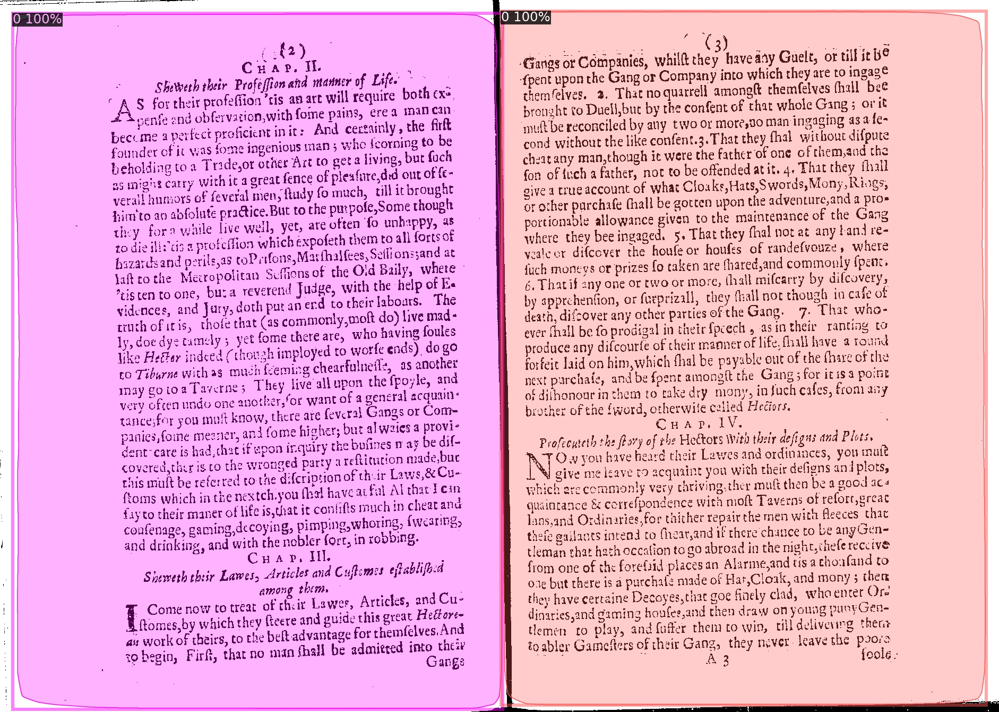

In [43]:
# Randomly select two tif files
selected_files = random.sample(tif_files, 1)
print(selected_files)

for file_name in selected_files:
    # Read the image
    image_path = os.path.join(source_directory, file_name)
    im = cv2.imread(image_path)

    # Make predictions
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    scores = outputs['instances'].scores.tolist()
    print(scores)

    # Visualize the predictions
    v = Visualizer(im[:, :, ::-1],
                   metadata=None,  # Change this to your metadata if available
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad! （Yufei's code ends here.）

In [20]:
####### attention! two flag #########

# sample low confidence img
sample = True

# re-predict 
re_predict = False

if sample:
    # Randomly select 100 tif files
    selected_files = random.sample(tif_files, 500)

    # Directory to save low confidence images
    low_confidence_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7_2nd_iteratoin_and_19_new_lableme"
    os.makedirs(low_confidence_directory, exist_ok=True)

    # List to store the names of images with low confidence boxes
    low_confidence_images = []

    for file_path in selected_files:
        # Read the image
        im = cv2.imread(file_path)

        # Make predictions
        outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Check if there are any boxes with score less than 0.90
        low_confidence = any(score < 0.90 for score in outputs["instances"].scores)
        
        if low_confidence:
            # Visualize the predictions
            v = Visualizer(im[:, :, ::-1],
                        metadata=None,  # Change this to your metadata if available
                        scale=0.5,
                        instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
            )
            out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
            
            # Save the visualized image to low confidence directory
            image_name = os.path.basename(file_path)
            new_image_name = image_name.replace('.tif', '_visualized.png')
            save_path = os.path.join(low_confidence_directory, new_image_name)
            cv2.imwrite(save_path, out.get_image()[:, :, ::-1])
            low_confidence_images.append(new_image_name)
            print(f"Saved low confidence image {file_path} as {save_path}")

    # Save the names of low confidence images to a JSON file
    json_output_path = "/trunk2/yufei/summer24/EEBO_page_extraction/low_confidence_images.json"
    with open(json_output_path, 'w') as json_file:
        json.dump(low_confidence_images, json_file, indent=4)

    print(f"Low confidence images saved to {json_output_path}")

if re_predict:
    test_list_path = "/trunk2/yufei/summer24/EEBO_page_extraction/test_list.txt"
    with open(test_list_path, 'r') as file:
        tif_files = [line.strip() for line in file]

    # Directory to save low confidence images
    low_confidence_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7_after_1st_iteration"
    os.makedirs(low_confidence_directory, exist_ok=True)

    for file_path in tif_files:
        # Read the image
        im = cv2.imread(file_path)

        # Make predictions
        outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Visualize the predictions
        v = Visualizer(im[:, :, ::-1],
                    metadata=None,  # Change this to your metadata if available
                    scale=0.5,
                    instance_mode=ColorMode.IMAGE_BW  # remove the colors of unsegmented pixels. This option is only available for segmentation models
        )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        
        # Save the visualized image to low confidence directory
        image_name = os.path.basename(file_path)
        new_image_name = image_name.replace('.tif', '_visualized.png')
        save_path = os.path.join(low_confidence_directory, new_image_name)
        cv2.imwrite(save_path, out.get_image()[:, :, ::-1])
        low_confidence_images.append(new_image_name)
        print(f"Saved low confidence image {file_path} as {save_path}")


/trunk2/yufei/anaconda3/envs/detectron/lib/python3.8/site-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


Saved low confidence image /trunk3/shared/datasets/EEBO/A18843_00014.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7_2nd_iteratoin_and_19_new_lableme/A18843_00014.000.001_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/A46235_00192.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7_2nd_iteratoin_and_19_new_lableme/A46235_00192.000.001_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/A68202_00318.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7_2nd_iteratoin_and_19_new_lableme/A68202_00318.000.001_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/B05399_title_cards_00001.0.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7_2nd_iteratoin_and_19_new_lableme/B05399_title_cards_00001.0_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/A16510_00010.000.001.tif as 

In [21]:
import os

# Directory paths
low_confidence_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7_2nd_iteratoin_and_19_new_lableme"
output_file_path = "/trunk2/yufei/summer24/EEBO_page_extraction/test_list.txt"

# Open the output file
with open(output_file_path, 'w') as output_file:
    # Iterate over all files in the directory
    for file_name in os.listdir(low_confidence_directory):
        # Check if the file is an image (e.g., PNG)
        if file_name.endswith('.png'):
            # Construct the original file path
            original_file_name = file_name.replace('_visualized.png', '.tif')
            original_file_path = f"/trunk3/shared/datasets/EEBO/{original_file_name}"
            # Write the original file path to the output file
            output_file.write(original_file_path + '\n')

print(f"Original image paths written to {output_file_path}")


Original image paths written to /trunk2/yufei/summer24/EEBO_page_extraction/test_list.txt


In [ ]:
# filter & visualize the results

import os
import json
import random
import cv2
import torch
from detectron2.structures import Boxes, Instances
from detectron2.utils.visualizer import Visualizer, ColorMode

def filter_boxes(pred_boxes, scores, pred_classes, im, rule="default"):
    """
    Apply filtering rules to the predicted boxes.
    
    Args:
        pred_boxes (Boxes): Predicted bounding boxes.
        scores (Tensor): Scores for the predicted bounding boxes.
        pred_classes (Tensor): Predicted classes for the bounding boxes.
        im (ndarray): The input image.
        rule (str): The rule to apply for filtering. Default is "default".
    
    Returns:
        filtered_boxes (Boxes): Filtered bounding boxes.
        filtered_scores (Tensor): Scores for the filtered bounding boxes.
        filtered_classes (Tensor): Classes for the filtered bounding boxes.
    """
    scores_np = scores.cpu().numpy()  # Convert scores to numpy array
    if rule == "default":
        if len(scores_np) >= 3:
            # Keep the top 2 highest scores
            top_indices = torch.argsort(scores)[-2:]  # Get the top 2 indices
            pred_boxes = pred_boxes[top_indices]
            scores = scores[top_indices]
            pred_classes = pred_classes[top_indices]
        elif len(scores_np) == 2:
            if scores_np.min() > 0.97 and (pred_boxes.area().sum() > 0.85 * (im.shape[0] * im.shape[1])) and (pred_boxes[0].intersection(pred_boxes[1]).area() < (im.shape[0] * im.shape[1] / 3)):
                pass  # Keep both boxes
            else:
                return None, None, None  # Skip this image
        elif len(scores_np) == 1:
            if scores_np[0] > 0.97:
                pass  # Keep this box
            else:
                return None, None, None  # Skip this image
        else:
            return None, None, None  # Skip if no boxes

    return pred_boxes, scores, pred_classes

# Define paths
source_directory = "/trunk3/shared/datasets/EEBO"
test_list_path = "/trunk2/yufei/summer24/EEBO_page_extraction/test_list.txt"
output_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning"
low_confidence_images = []

# Load test list
with open(test_list_path, 'r') as file:
    test_files = [line.strip() for line in file]

# Make sure the output directory exists
os.makedirs(output_directory, exist_ok=True)

# Iterate over all files in the test list
for file_path in test_files:
    # Read the image
    im = cv2.imread(file_path)

    # Make predictions
    outputs = predictor(im)

    # Extract predictions
    pred_boxes = outputs['instances'].pred_boxes
    scores = outputs['instances'].scores
    pred_classes = outputs['instances'].pred_classes

    # Apply filtering rules
    filtered_boxes, filtered_scores, filtered_classes = filter_boxes(pred_boxes, scores, pred_classes, im)

    if filtered_boxes is None:
        continue  # Skip this image if no boxes passed the filter

    # Create a new Instances object with the filtered predictions
    filtered_instances = Instances(outputs['instances'].image_size)
    filtered_instances.pred_boxes = filtered_boxes
    filtered_instances.scores = filtered_scores
    filtered_instances.pred_classes = filtered_classes

    # Visualize the filtered predictions
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW)
    out = v.draw_instance_predictions(filtered_instances.to("cpu"))
    
    # Construct output file path
    output_file_name = os.path.basename(file_path).replace('.tif', '_visualized.png')
    output_file_path = os.path.join(output_directory, output_file_name)

    # Save the visualization
    cv2.imwrite(output_file_path, out.get_image()[:, :, ::-1])

    # Add the image path to the list of low confidence images
    low_confidence_images.append(file_path)

    # print(f"Processed and saved: {output_file_path}")

# Save the list of processed image paths to a JSON file
json_output_path = os.path.join(output_directory, "processed_images.json")
with open(json_output_path, 'w') as json_file:
    json.dump(low_confidence_images, json_file, indent=4)

print(f"Processed images list saved to {json_output_path}")


In [ ]:
# write iterative
import os

# Directory paths
iterative_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning"
output_file_path = "/trunk2/yufei/summer24/EEBO_page_extraction/iterative_list.txt"

# Open the output file
with open(output_file_path, 'w') as output_file:
    # Iterate over all files in the directory
    for file_name in os.listdir(iterative_directory):
        # Check if the file is an image (e.g., PNG)
        if file_name.endswith('.png'):
            # Construct the original file path
            original_file_name = file_name.replace('_visualized.png', '.tif')
            original_file_path = f"/trunk3/shared/datasets/EEBO/{original_file_name}"
            # Write the original file path to the output file
            output_file.write(original_file_path + '\n')

print(f"Original image paths written to {output_file_path}")

In [ ]:
# add new json and img file to training
import shutil

def save_filtered_results(image_path, filtered_boxes, output_dir):
    """
    Save the filtered results to a JSON file.
    
    Args:
        image_path (str): Path to the input image.
        filtered_boxes (Boxes): Filtered bounding boxes.
        output_dir (str): Directory to save the JSON file.
    """
    # Convert the boxes to polygons
    polygons = []
    for box in filtered_boxes:
        x1, y1, x2, y2 = box.tolist()
        polygon = [
            [x1, y1],
            [x1, y2],
            [x2, y2],
            [x2, y1]
        ]
        polygons.append({
            "polygon": polygon,
            "confidence": 1,
            "channel": "page"
        })
    
    # Construct the output file path
    file_name = os.path.basename(image_path).replace('.tif', '.json')
    output_file_path = os.path.join(output_dir, file_name)
    
    # Write the polygons to the JSON file
    with open(output_file_path, 'w') as json_file:
        json.dump(polygons, json_file, indent=4)

    print(f"Saved filtered results to {output_file_path}")

# Define paths
source_directory = "/trunk3/shared/datasets/EEBO"
iterative_list_path = "/trunk2/yufei/summer24/EEBO_page_extraction/iterative_list.txt"
output_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/train"
train_image_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/train"

# Load iterative list
with open(iterative_list_path, 'r') as file:
    test_files = [line.strip() for line in file]

# Make sure the output directories exist
os.makedirs(output_directory, exist_ok=True)
os.makedirs(train_image_directory, exist_ok=True)

# Iterate over all files in the iterative list
for file_path in test_files:
    # Read the image
    im = cv2.imread(file_path)

    # Make predictions
    outputs = predictor(im)

    # Extract predictions
    pred_boxes = outputs['instances'].pred_boxes
    scores = outputs['instances'].scores
    pred_classes = outputs['instances'].pred_classes

    # Apply filtering rules
    filtered_boxes, filtered_scores, filtered_classes = filter_boxes(pred_boxes, scores, pred_classes, im)

    if filtered_boxes is None:
        continue  # Skip this image if no boxes passed the filter

    # Save the filtered results to a JSON file
    save_filtered_results(file_path, filtered_boxes, output_directory)

    # Copy the image to the train image directory
    image_name = os.path.basename(file_path)
    destination_path = os.path.join(train_image_directory, image_name)
    shutil.copyfile(file_path, destination_path)
    print(f"Copied image {file_path} to {destination_path}")

In [ ]:
import os

def count_files(directory):
    return len([f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))])

pictures_directory = '/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/train'
jsons_directory = '/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/train'

pictures_count = count_files(pictures_directory)
jsons_count = count_files(jsons_directory)

print(f"Number of files in pictures/train: {pictures_count}")
print(f"Number of files in jsons/train: {jsons_count}")

In [52]:
import os
import cv2
import json
import random
import tifffile as tiff

# Read the image list
image_list_path = "/trunk2/yufei/summer24/EEBO_page_extraction/image_list_1000.txt"
with open(image_list_path, 'r') as file:
    image_list = [line.strip() for line in file]

# Directory to save the processed images
output_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/image_list_1000"
os.makedirs(output_directory, exist_ok=True)

# Function to add text to an image
def add_text_to_image(image, text):
    font = cv2.FONT_HERSHEY_SIMPLEX
    position = (10, 30)
    font_scale = 2
    font_color = (255, 0, 0)  
    thickness = 3
    line_type = cv2.LINE_AA

    # Ensure the image is in the correct format
    if image.dtype != 'uint8':
        image = cv2.convertScaleAbs(image)

    image = image.copy()  # Make a copy to avoid modifying the original image
    cv2.putText(image, text, position, font, font_scale, font_color, thickness, line_type)
    return image

# Iterate through the image list and process each image
for image_info in image_list:
    parts = image_info.split('/')
    folder_name = parts[0]
    file_info = parts[1]
    
    if 'right' in file_info:
        side = 'right'
    elif 'left' in file_info:
        side = 'left'
    else:
        continue  # Skip if side information is not found
    
    tif_file_name = file_info.replace(f".{side}.png", ".tif")
    tif_file_path = os.path.join("/trunk3/shared/datasets/EEBO", folder_name + '_' + tif_file_name)
    
    # Check if the output file already exists
    new_image_name = folder_name + '_' + file_info.replace('.png', '_visualized.png')
    save_path = os.path.join(output_directory, new_image_name)
    if os.path.exists(save_path):
        print(f"File already exists: {save_path}")
        continue

    # Read the image using tifffile
    try:
        im = tiff.imread(tif_file_path)
    except Exception as e:
        print(f"Error reading TIFF file {tif_file_path}: {e}")
        continue

    # Check if image is successfully read
    if im is None:
        print(f"Failed to read image: {tif_file_path}")
        continue
    
    # Handle large buffers by resizing the image if needed
    max_dimension = 5000  # Set your maximum dimension limit
    if max(im.shape) > max_dimension:
        scale_factor = max_dimension / max(im.shape)
        im = cv2.resize(im, (int(im.shape[1] * scale_factor), int(im.shape[0] * scale_factor)))
    
    # Make predictions
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # Visualize the predictions
    v = Visualizer(im[:, :, ::-1],
                   metadata=None,  # Change this to your metadata if available
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW  # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    
    # Add side information to the image
    result_image = out.get_image()[:, :, ::-1]
    result_image_with_text = add_text_to_image(result_image, side)

    # Save the visualized image to the output directory
    cv2.imwrite(save_path, result_image_with_text)
    print(f"Saved processed image {save_path}")

print("Processing completed.")


Error reading TIFF file /trunk3/shared/datasets/EEBO/A30018: [Errno 2] No such file or directory: '/trunk3/shared/datasets/EEBO/A30018'
Error reading TIFF file /trunk3/shared/datasets/EEBO/A35232: [Errno 2] No such file or directory: '/trunk3/shared/datasets/EEBO/A35232'
Error reading TIFF file /trunk3/shared/datasets/EEBO/A39696: [Errno 2] No such file or directory: '/trunk3/shared/datasets/EEBO/A39696'
Error reading TIFF file /trunk3/shared/datasets/EEBO/A46811: [Errno 2] No such file or directory: '/trunk3/shared/datasets/EEBO/A46811'
Error reading TIFF file /trunk3/shared/datasets/EEBO/A07229: [Errno 2] No such file or directory: '/trunk3/shared/datasets/EEBO/A07229'
Error reading TIFF file /trunk3/shared/datasets/EEBO/A47352: [Errno 2] No such file or directory: '/trunk3/shared/datasets/EEBO/A47352'
Error reading TIFF file /trunk3/shared/datasets/EEBO/A69887: [Errno 2] No such file or directory: '/trunk3/shared/datasets/EEBO/A69887'
Error reading TIFF file /trunk3/shared/datasets/